In [1]:
import netCDF4
import numpy as np
import pandas as pd
import os
import xarray as xr
from fbprophet.utilities import regressor_coefficients
import pandas as pd
from fbprophet import Prophet
import seaborn as sns
import multiprocessing
multiprocessing.set_start_method("fork")

Importing plotly failed. Interactive plots will not work.


# CERES

In [2]:
ceres_1 = pd.read_parquet("../CERES_2022-11-09_25176/ceres.parquet.gzip")
ceres_2 = pd.read_parquet("../CERES_2022-11-09_25176/ceres1.parquet.gzip")


In [3]:
ceres = pd.concat([ceres_2,ceres_1])

In [4]:
lat_lon_weight = pd.read_csv("zone_weights_lou.txt")

In [5]:
ceres = ceres.query('lat > -66 & lat <66')

In [6]:
weights = []
for index, group in ceres.groupby(level="lat"):
    weight = lat_lon_weight[lat_lon_weight["lat"] ==index]["weight"].iloc[0]
    weights.append(weight)

In [7]:
i=0 
for index, group in ceres.groupby(level="lat"):
    ceres.loc[(slice(None), index,slice(None)),"weights"] = weights[i] 
    i+=1


In [8]:
TERMINATOR = True
ceres["albedo"] = ceres["toa_alb_all_mon"]*ceres["weights"]*(1/360.0)
data_agg_ceres = ceres.groupby(level="time").mean()
if TERMINATOR: 
    data_agg_ceres["albedo"]=(360*132/np.sum(weights))*data_agg_ceres["albedo"]
else:
    data_agg_ceres["albedo"]=(360*180)*data_agg_ceres["albedo"]

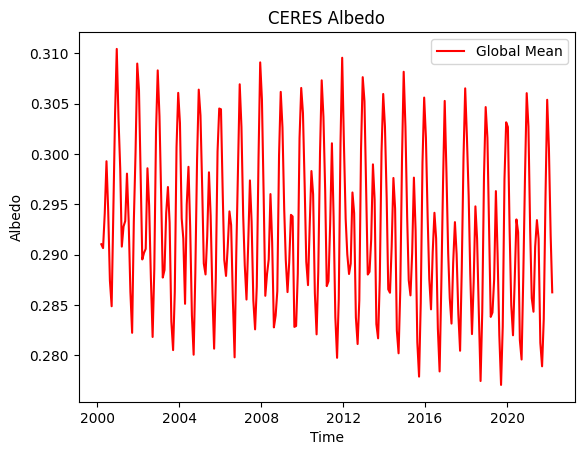

In [22]:
import matplotlib.pyplot as plt
sns.lineplot(data_agg_ceres["albedo"],label="Global Mean",c="red")
plt.ylabel("Albedo")
plt.xlabel("Time")
plt.title("CERES Albedo")
plt.savefig('plots/albedo.png')


In [24]:
data_agg_ceres

,toa_alb_all_mon,cldarea_high_mon,cldarea_mid_high_mon,cldarea_mid_low_mon,cldarea_low_mon,cldarea_total_mon,cldtau_high_mon,cldtau_mid_high_mon,cldtau_mid_low_mon,cldtau_low_mon,...,cldicerad_mid_high_mon,cldicerad_mid_low_mon,cldicerad_low_mon,cldicerad_total_mon,ini_precip_mon,ini_albedo_mon,ini_aod55_mon,aux_snow_mon,weights,albedo
time,,,,,,,,,,,,,,,,,,,,,
2000-03-15,0.312788,6.846907,14.951444,12.891829,33.182789,67.636246,4.791090,4.411668,4.554078,4.090369,...,28.023495,28.743219,27.095188,28.744324,2.332126,0.120219,0.168323,9.182354,0.006916,0.291025
2000-04-15,0.311629,7.400873,15.309649,12.972313,32.708191,68.159760,4.560654,4.409148,4.229863,3.855968,...,28.002739,28.850346,27.059870,28.780293,2.407079,0.112389,0.168412,6.377250,0.006916,0.290642
2000-05-15,0.314572,6.920599,15.106735,12.957911,33.825241,68.572029,4.056704,4.329619,4.151834,3.747267,...,27.845039,28.577431,26.719650,28.521759,2.437851,0.104387,0.175805,3.704724,0.006916,0.294092
2000-06-15,0.318689,7.170186,14.879628,12.678125,33.754410,68.240837,4.282924,4.317411,4.156006,3.677443,...,27.774210,28.341501,26.666466,28.448711,2.500622,0.102316,0.171341,2.753612,0.006916,0.299281
2000-07-15,0.314004,7.191899,14.475276,12.560626,33.983208,67.969292,4.071827,4.219954,4.102843,3.719111,...,27.532320,28.199322,26.981134,28.246572,2.584391,0.105884,0.172570,3.117576,0.006916,0.294430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.317194,9.201469,16.892994,11.504344,33.284435,70.648598,2.633922,3.254052,4.135165,3.704818,...,26.024261,22.442530,22.240236,26.813000,2.298761,0.111129,0.129846,5.388642,0.006916,0.295697
2021-12-15,0.327058,9.421170,17.212154,11.019817,33.082489,70.501717,2.661821,3.267895,4.292187,3.780621,...,25.546408,22.214247,22.416288,26.548124,2.281462,0.115122,0.134464,7.203181,0.006916,0.305395
2022-01-15,0.322240,9.370300,17.302092,11.191473,31.615175,69.252838,2.638764,3.341667,4.293649,3.747269,...,25.191231,22.268417,22.393343,26.218035,2.252747,0.120600,0.145754,9.059677,0.006916,0.300559


### Define Spatial Resolution

In [37]:
resolutions = np.arange(5,60,5)
resolutions = np.insert(resolutions,0,1)

#Flip for debugging purposes
resolutions = np.flip(resolutions)

In [18]:
to_drop = list(filter(lambda x:"total" not in x, [col  for col in ceres.columns if "cld" in col]))
ceres.drop(to_drop,axis=1,inplace=True)

Albedo sets
Observed TOA fluxes: All-sky albedo

Observed Cloud Parameters (low, mid-low, mid-high, and high), Cloud Area Fraction, Liquid Water Path, Ice Water Path, Water Particle Radius, Ice Particle Radius
Initial Meteorological Parameters: Surface albedo, precipitable water, MATCH AOD @0.55 um

Surface data: Snow/Ice Percent Coverage

Do it with Single Cloud Fraction for now
Sum the cloud variables or find and existing one 


In [20]:
ceres.columns

Index(['toa_alb_all_mon', 'cldarea_total_mon', 'cldtau_total_mon',
       'cldtau_lin_total_mon', 'lwp_high_mon', 'lwp_mid_high_mon',
       'lwp_mid_low_mon', 'lwp_low_mon', 'lwp_total_mon', 'iwp_high_mon',
       'iwp_mid_high_mon', 'iwp_mid_low_mon', 'iwp_low_mon', 'iwp_total_mon',
       'cldwatrad_total_mon', 'cldicerad_total_mon', 'ini_precip_mon',
       'ini_albedo_mon', 'ini_aod55_mon', 'aux_snow_mon', 'weights', 'albedo'],
      dtype='object')

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000507 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000667 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000187 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000544 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000488 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000324 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.24 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000158 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000321 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.21 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.00042 seconds

1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!
Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!




Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000586 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000584 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.84 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model


Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000318 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000186 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.86 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 29.1155 seconds (Warm-up)
               40.9284 seconds (Sampling)
               70.0438 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000356 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.56 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000673 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000368 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your mode


Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000439 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.39 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000164 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000163 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000257 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.57 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000258 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.58 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000543 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.43 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 29.0771 seconds (Warm-up)
               38.824 seconds (Sampling)
               67.9012 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 




Gradient evaluation took 0.000559 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.59 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000207 seconds
Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000255 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 30.7686 seconds (Warm-up)
               39.0204 seconds (Sampling)
               69.7889 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000267 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000164 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000305 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000405 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.05 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000702 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000263 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000231 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000367 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000432 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00029 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.002511 seconds
1000 transitions using 10 leapfrog steps per transition would take 25.11 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa


 Elapsed Time: 30.3408 seconds (Warm-up)
               39.0008 seconds (Sampling)
               69.3417 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000352 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.52 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000566 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000521 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000403 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.03 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000385 seconds

Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 3.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000487 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000163 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000206 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000182 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000181 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War


 Elapsed Time: 30.6575 seconds (Warm-up)
               39.2917 seconds (Sampling)
               69.9492 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000351 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.51 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000311 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.11 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000342 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.42 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000191 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000186 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000145 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.45 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000216 seconds
Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!





Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000158 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000308 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.08 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000508 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000661 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000752 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.52 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000686 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000584 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000415 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)


If this warning occurs sporadically, such as for highly constrained variable typ


Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000184 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000157 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000206 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.06 seconds.
Gradient evaluation took 0.000193 seconds
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000171 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000164 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000405 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000157 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000155 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000306 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.

Adjust your expectations accordingly!


Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 32.153 seconds (Warm-up)
               39.1668 seconds (Sampling)
               71.3198 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warni


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000162 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000169 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000174 seconds
Gradient evaluation took 0.000179 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.79 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000174 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000156 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.56 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000378 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000158 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)


If this warning occurs sporadically, such as for highly constrained variable typ


Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000207 seconds
Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000207 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000185 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 29.9272 seconds (Warm-up)
               39.4639 seconds (Sampling)
               69.3911 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.0004 seconds
1000 transitions using 10 leapfrog steps per transition would take 4 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000495 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.

Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Adjust your expectations accordingly!



Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000624 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000457 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.57 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00065 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.5 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 0.000249 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.49 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000379 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.003933 seconds
1000 transitions using 10 leapfrog steps per transition would take 39.33 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.

Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!



Adjust your expectations accordingly!
Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!





Gradient evaluation took 0.000182 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00049 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00042 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000688 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.88 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000461 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,Exception: normal_lpdf: Scale parameter is 0, bu


Gradient evaluation took 0.000358 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.58 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000476 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.76 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000524 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00046 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000413 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.13 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 29.1027 seconds (Warm-up)
               39.5186 seconds (Sampling)
               68.6213 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000664 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000507 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.07 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000644 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.44 seconds.
Iteration:   1 / 1000 [  0%]  (Warmup)
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000302 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000198 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000161 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W


 Elapsed Time: 30.8982 seconds (Warm-up)
               39.5399 seconds (Sampling)
               70.4381 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00025 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.5 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000639 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.39 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.
Informational Message: The current Metropolis proposa


Gradient evaluation took 0.000205 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W


 Elapsed Time: 30.8827 seconds (Warm-up)
               39.5333 seconds (Sampling)
               70.4159 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000515 seconds


1000 transitions using 10 leapfrog steps per transition would take 5.15 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000613 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.13 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000534 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.34 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 0.00286 seconds
1000 transitions using 10 leapfrog steps per transition would take 28.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000179 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:but if this warning occurs often then your model




Gradient evaluation took 0.000674 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.74 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000662 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.62 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000372 seconds

Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W


 Elapsed Time: 30.5476 seconds (Warm-up)
               39.5559 seconds (Sampling)
               70.1035 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000275 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000406 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.06 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000296 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000509 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.09 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000158 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000284 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000261 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 31.2699 seconds (Warm-up)
               39.6281 seconds (Sampling)
               70.898 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000229 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.29 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000458 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.58 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00026 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000508 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.08 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model


Gradient evaluation took 0.000238 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.38 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000185 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.85 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.001579 seconds
1000 transitions using 10 leapfrog steps per transition would take 15.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.001164 seconds
1000 transitions using 10 leapfrog steps per transition would take 11.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000191 seconds
Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.

Adjust your expectations accordingly!




Gradient evaluation took 0.000222 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.22 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W


 Elapsed Time: 30.1906 seconds (Warm-up)
               39.4559 seconds (Sampling)
               69.6464 seconds (Total)



INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000672 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000433 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000222 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000491 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000245 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000245 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00042 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000365 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000204 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000163 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000223 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000169 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000384 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.84 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000746 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.46 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



 Elapsed Time: 29.3284 seconds (Warm-up)
               39.3521 seconds (Sampling)
               68.6805 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000275 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000194 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000196 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000159 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000174 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000249 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.49 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000404 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.04 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000644 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000668 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000371 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.71 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 0.00033 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.3 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000549 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.49 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000511 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000418 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000169 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000482 seconds

Gradient evaluation took 0.000184 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000163 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.63 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 4.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00046 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000575 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.75 seconds.
Adjust your expectations accordingly!

Gradient evaluation took 0.000623 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.23 seconds.
Adjust your expectations accordingly!




Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000424 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.001337 seconds
1000 transitions using 10 leapfrog steps per transition would take 13.37 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000347 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.47 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.00031 seconds
Gradient evaluation took 0.000812 seconds
1000 transitions using 10 leapfrog steps per transition would take 8.12 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 3.1 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000433 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.33 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 0.000967 seconds
Gradient evaluation took 0.000765 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.65 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 9.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.001053 seconds
1000 transitions using 10 leapfrog steps per transition would take 10.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000299 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000492 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Informational Message: The current Metropolis proposal is about to be rejected be


Gradient evaluation took 0.000481 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000444 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000198 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.98 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00027 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000191 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000232 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000573 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000444 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000369 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000392 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000561 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000296 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000781 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 0.000232 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.003241 seconds
Iteration:   1 / 1000 [  0%]  (Warmup)
1000 transitions using 10 leapfrog steps per transition would take 32.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000182 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000365 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000611 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000429 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.29 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000553 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.53 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000499 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00024 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.4 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000621 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000185 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.85 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000343 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000414 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.14 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000382 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000393 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000409 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000305 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000302 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000549 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.49 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000572 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000463 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000659 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000649 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.49 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.001614 seconds
1000 transitions using 10 leapfrog steps per transition would take 16.14 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000791 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000241 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.41 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000642 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000342 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.42 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000611 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.11 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000626 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.26 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000325 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.25 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.002204 seconds
1000 transitions using 10 leapfrog steps per transition would take 22.04 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000403 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000256 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.56 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000394 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.94 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000644 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.44 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000204 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000406 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000467 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model


Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000299 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000292 seconds
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000326 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.26 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000261 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000591 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000194 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.94 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000191 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.003749 seconds
1000 transitions using 10 leapfrog steps per transition would take 37.49 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00032 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00052 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable typ


Gradient evaluation took 0.000329 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000529 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000559 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000245 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000454 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.54 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000196 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000672 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000307 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.07 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000347 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.47 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000445 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000497 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000258 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.001332 seconds
1000 transitions using 10 leapfrog steps per transition would take 13.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00122 seconds
1000 transitions using 10 leapfrog steps per transition would take 12.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos


Gradient evaluation took 0.000359 seconds

Gradient evaluation took 0.000317 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.17 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
1000 transitions using 10 leapfrog steps per transition would take 3.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000528 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000506 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

IndexError: index 19 is out of bounds for axis 0 with size 19

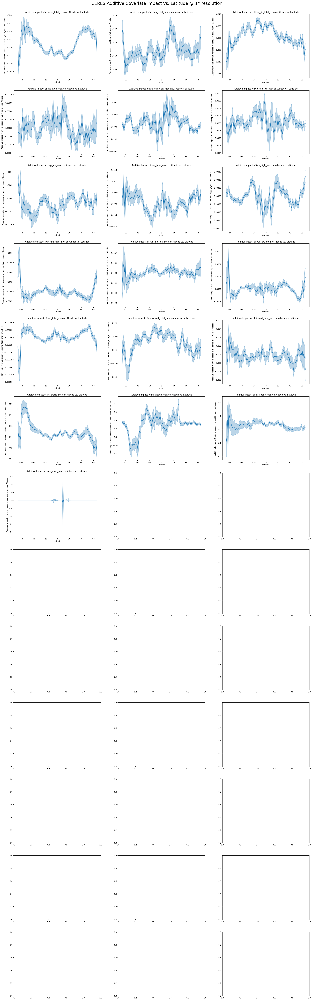

In [21]:
import multiprocessing
all_regressors_dfs = {}
resolutions = [1]
for resolution in resolutions: 
    i = 0
    regressor_dfs = []
    for index, group in ceres.groupby(level="lat"):
    #     print(i%resolution)

        if i%resolution==0:

            group = group.groupby("time").mean()

        #     group["weighted_albedo"] = (group['wtoa_sw_all_mon']/group['wsolar_mon']).astype(float)
            group["y"] = group.toa_alb_all_mon
            group.replace([np.inf, -np.inf], np.nan,inplace = True)
            group = group.interpolate()
            group["ds"] = group.index
        #     print(group["y"])
            group.drop(["albedo",
                        "toa_alb_all_mon"  ,
                        "weights"],axis=1,inplace=True)
            m = Prophet(mcmc_samples=1000)
    #         m = Prophet()

            for col in group.columns:
                if col not in ["y","ds"]:
                    m.add_regressor(col)
            m.fit(group)
            
#             coef = beta * m.y_scale / params['std']
            regressor_df = regressor_coefficients(m)

            regressor_df["lat"]  = index
            regressor_dfs.append(regressor_df)
            if i!=0:
                i=0
                continue
        i+=1
    regressor_dfs_concat = pd.concat(regressor_dfs)
    unique_labels = regressor_dfs_concat["regressor"].unique()

    all_regressors_dfs[resolution] = regressor_dfs_concat
    ### Plotting
    subset_range = False
    fig, axarr = plt.subplots(13, 3,figsize=(30,100))
    fig.suptitle(fr'CERES Additive Covariate Impact vs. Latitude @ {resolution}$\degree$ resolution',y=0.89,fontsize=24)
    idx=0
    for i in range(0,len(axarr)):
        for j in range(0,len(axarr[i])):
            label=unique_labels[idx]
            subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label]
    #         print(subset)
            sns.lineplot(x="lat",y="coef",data = subset,ax=axarr[i][j], color='C0')
            sns.lineplot(x="lat",y="coef_upper",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
            sns.lineplot(x="lat",y="coef_lower",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
            axarr[i][j].fill_between(subset["lat"], subset["coef_lower"], subset["coef_upper"], alpha=.3)

            axarr[i][j].set_ylabel(f"Additive Impact of Unit increase in {label} on Albedo")
            axarr[i][j].set_xlabel(f"Latitude")
            axarr[i][j].set_title(f"Additive Impact of {label} on Albedo vs. Latitude")  
            if subset_range:
                axarr[i][j].set_ylim(-.005,.005)
            idx+=1
    plt.savefig(f'plots/additive_albedo_impact_resolution={resolution}.png')

In [98]:
regressor_dfs_concat

,regressor,regressor_mode,center,coef_lower,coef,coef_upper,lat
0,cldarea_high_mon,additive,2.340384,-0.592251,-0.250807,0.023711,-65.5
1,cldarea_mid_high_mon,additive,23.588648,-0.593506,-0.251494,0.022851,-65.5
2,cldarea_mid_low_mon,additive,22.858639,-0.595194,-0.253350,0.021112,-65.5
3,cldarea_low_mon,additive,41.120083,-0.594596,-0.252778,0.021742,-65.5
4,cldarea_total_mon,additive,89.907753,-0.020899,0.253644,0.595335,-65.5
...,...,...,...,...,...,...,...
34,cldicerad_total_mon,additive,29.281052,-0.000344,0.003520,0.007341,65.5
35,ini_precip_mon,additive,0.895910,-0.039361,-0.024555,-0.010682,65.5
36,ini_albedo_mon,additive,0.311817,0.115154,0.187736,0.259937,65.5
37,ini_aod55_mon,additive,0.106474,-0.012120,0.007904,0.028318,65.5


In [67]:
import hdbs

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,cldarea_high_mon,additive,2.340384,-0.653819,-0.120829,0.546605
1,cldarea_mid_high_mon,additive,23.588648,-0.654832,-0.121666,0.544482
2,cldarea_mid_low_mon,additive,22.858639,-0.656447,-0.123614,0.543977
3,cldarea_low_mon,additive,41.120083,-0.656120,-0.122805,0.544596
4,cldarea_total_mon,additive,89.907753,-0.543520,0.123780,0.656609
5,cldtau_high_mon,additive,2.235741,-0.002769,-0.001033,0.000688
6,cldtau_mid_high_mon,additive,2.386132,0.011105,0.023312,0.034229
7,cldtau_mid_low_mon,additive,6.247178,-0.001445,0.004721,0.010058
8,cldtau_low_mon,additive,6.410235,0.007557,0.018249,0.026539
9,cldtau_total_mon,additive,4.844701,-0.031165,-0.014396,0.006301


In [72]:
scaling = pd.DataFrame(m.extra_regressors)
print(scaling)

            cldarea_high_mon cldarea_mid_high_mon cldarea_mid_low_mon  \
prior_scale             10.0                 10.0                10.0   
standardize             auto                 auto                auto   
mu                  2.340384            23.588648           22.858639   
std                 2.031612             2.548997            4.231849   
mode                additive             additive            additive   

            cldarea_low_mon cldarea_total_mon cldtau_high_mon  \
prior_scale            10.0              10.0            10.0   
standardize            auto              auto            auto   
mu                41.120083         89.907753        2.235741   
std                3.334296          2.872044        1.520014   
mode               additive          additive        additive   

            cldtau_mid_high_mon cldtau_mid_low_mon cldtau_low_mon  \
prior_scale                10.0               10.0           10.0   
standardize                auto 

In [92]:
regressor_df_cop

,regressor,regressor_mode,center,coef_lower,coef,coef_upper,coef_standardized
0,cldarea_high_mon,additive,2.340384,-0.653819,-0.120829,0.546605,-0.03111
1,cldarea_mid_high_mon,additive,23.588648,-0.654832,-0.121666,0.544482,-0.03111
2,cldarea_mid_low_mon,additive,22.858639,-0.656447,-0.123614,0.543977,-0.03111
3,cldarea_low_mon,additive,41.120083,-0.656120,-0.122805,0.544596,-0.03111
4,cldarea_total_mon,additive,89.907753,-0.543520,0.123780,0.656609,-0.03111
5,cldtau_high_mon,additive,2.235741,-0.002769,-0.001033,0.000688,-0.03111
6,cldtau_mid_high_mon,additive,2.386132,0.011105,0.023312,0.034229,-0.03111
7,cldtau_mid_low_mon,additive,6.247178,-0.001445,0.004721,0.010058,-0.03111
8,cldtau_low_mon,additive,6.410235,0.007557,0.018249,0.026539,-0.03111
9,cldtau_total_mon,additive,4.844701,-0.031165,-0.014396,0.006301,-0.03111


In [91]:
regressor_df_cop = regressor_df.copy()
regressor_df_cop["coef_standardized"] = 0
for regressor, params in m.extra_regressors.items():
    standard_dev = scaling[regressor].loc["std"]
    regressor_df_cop.loc[:,"coef_standardized"] = (regressor_df_cop[regressor_df_cop["regressor"] == regressor]["coef"]*standard_dev).iloc[0]
    
#     print("*"*100)
#     beta = m.params['beta'][:, regressor_index(m, regressor)]
#     print(beta)
#         if params['mode'] == 'additive':
#             coef = beta * m.y_scale / params['std']

In [19]:
import matplotlib.pyplot as plt
# subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == "CLDHGH"].reset_index(drop=True)
regressor_dfs_concat = pd.concat(regressor_dfs)
unique_labels = regressor_dfs_concat["regressor"].unique()


In [20]:
15%15

0

In [22]:
data_agg_ceres["cldarea_low_mon"]-data_agg_ceres["cldarea_mid_high_mon"]


time
2000-03-15    18.231346
2000-04-15    17.398540
2000-05-15    18.718506
2000-06-15    18.874783
2000-07-15    19.507931
                ...    
2021-11-15    16.391441
2021-12-15    15.870335
2022-01-15    14.313084
2022-02-15    13.357483
2022-03-15    13.808535
Length: 265, dtype: float32

In [94]:
all_regressors_dfs

{}

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode'], dtype='object')
  subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label].rolling(30).mean()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode'], dtype='object')
  subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label].rolling(30).mean()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode'], dtype='object')
  subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label].rolling(30).mean()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode'], dtype='object')
  subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label].rolling(30).mean()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_59939/2301620827.py:8: FutureWarning: Dropping of nuisance columns 

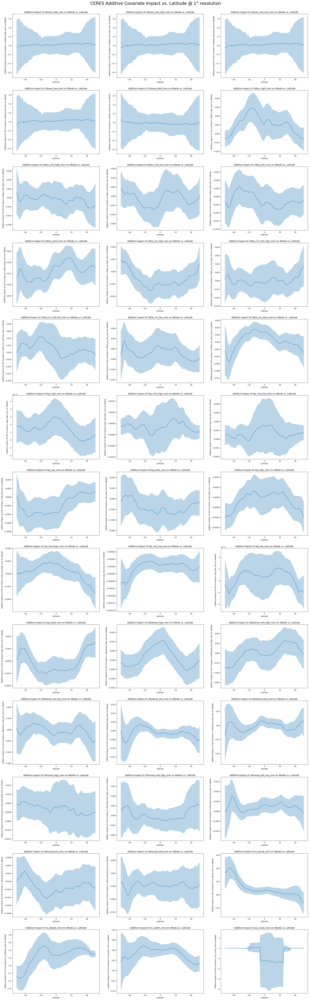

In [106]:
subset_range = False
fig, axarr = plt.subplots(13, 3,figsize=(30,100))
fig.suptitle(fr'CERES Additive Covariate Impact vs. Latitude @ {resolution}$\degree$ resolution',y=0.89,fontsize=24)
idx=0
for i in range(0,len(axarr)):
    for j in range(0,len(axarr[i])):
        label=unique_labels[idx]
        subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label].rolling(30).mean()
        subset.reset_index(drop=True,inplace=True)
        sns.lineplot(x="lat",y="coef",data = subset,ax=axarr[i][j], color='C0')
        sns.lineplot(x="lat",y="coef_upper",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
        sns.lineplot(x="lat",y="coef_lower",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
        axarr[i][j].fill_between(subset["lat"], subset["coef_lower"], subset["coef_upper"], alpha=.3)

        axarr[i][j].set_ylabel(f"Additive Impact of Unit increase in {label} on Albedo")
        axarr[i][j].set_xlabel(f"Latitude")
        axarr[i][j].set_title(f"Additive Impact of {label} on Albedo vs. Latitude")  
        if subset_range:
            axarr[i][j].set_ylim(-.005,.005)
        idx+=1
plt.savefig(f'plots/additive_albedo_impact_resolution={resolution}.png')


### HEMISPHERIC SYMMETRY  ANALYSIS

In [214]:
data_agg_ceres_north = ceres.query('lat>0')
data_agg_ceres_south = ceres.query('lat<0')

data_agg_ceres_north = data_agg_ceres_north.groupby(level="time").mean()
data_agg_ceres_south = data_agg_ceres_south.groupby(level="time").mean()

if TERMINATOR: 
    data_agg_ceres_north["albedo"]=((360*132/np.sum(weights))*data_agg_ceres_north["albedo"])
    data_agg_ceres_south["albedo"]=((360*132/np.sum(weights))*data_agg_ceres_south["albedo"])

else:
    data_agg_ceres["albedo"]=(360*180)*data_agg_ceres["albedo"]

#### North

In [215]:
import multiprocessing
# multiprocessing.set_start_method("fork")
group = data_agg_ceres_north.copy()
group["y"] = group.albedo
group.replace([np.inf, -np.inf], np.nan,inplace = True)
# group = group.interpolate()
group["ds"] = group.index
print(group["y"])
group.drop(['albedo','toa_alb_all_mon','weights'],axis=1,inplace=True)
mN = Prophet(mcmc_samples=1000)

for col in group.columns:
    if col not in ["y","ds"]:
        mN.add_regressor(col)
mN.fit(group)
N_regressor_df = regressor_coefficients(mN)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


time
2000-03-15    0.294908
2000-04-15    0.282973
2000-05-15    0.279059
2000-06-15    0.275984
2000-07-15    0.273676
                ...   
2021-11-15    0.314892
2021-12-15    0.333262
2022-01-15    0.327029
2022-02-15    0.312759
2022-03-15    0.294196
Name: y, Length: 265, dtype: float64


/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)





Gradient evaluation took 0.00042 seconds
Gradient evaluation took 0.00059 seconds
Gradient evaluation took 0.000608 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.9 seconds.
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 6.08 seconds.


Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000854 seconds
1000 transitions using 10 leapfrog steps per transition would take 8.54 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned 

Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

#### South 

In [216]:
import multiprocessing
# multiprocessing.set_start_method("fork")
group = data_agg_ceres_south.copy()
group["y"] = group.albedo
group.replace([np.inf, -np.inf], np.nan,inplace = True)
# group = group.interpolate()
group["ds"] = group.index
group.drop(['albedo','toa_alb_all_mon','weights'],axis=1,inplace=True)
mS = Prophet(mcmc_samples=1000)

for col in group.columns:
    if col not in ["y","ds"]:
        mS.add_regressor(col)
mS.fit(group)
S_regressor_df = regressor_coefficients(mS)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis propos



Gradient evaluation took 0.001156 seconds
Gradient evaluation took 0.000728 seconds
1000 transitions using 10 leapfrog steps per transition would take 11.56 seconds.
1000 transitions using 10 leapfrog steps per transition would take 7.28 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!






Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000908 seconds
1000 transitions using 10 leapfrog steps per transition would take 9.08 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (


 Elapsed Time: 42.4199 seconds (Warm-up)
               46.8543 seconds (Sampling)
               89.2742 seconds (Total)



In [217]:
N_regressor_df["hemisphere"] = "north"
S_regressor_df["hemisphere"] = "south"


#### Relative Impacts in Z-scored normalized units

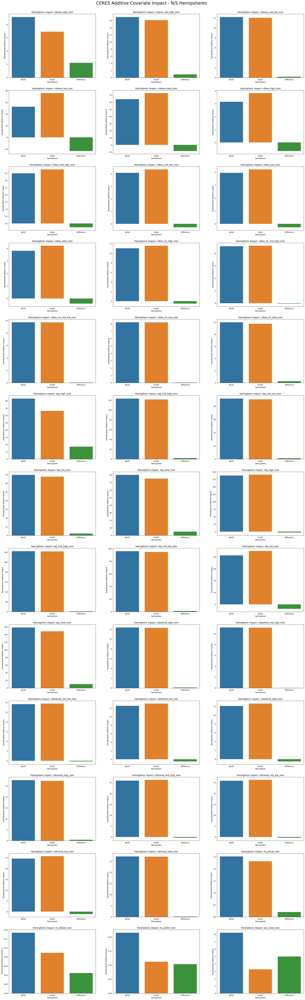

In [219]:
import matplotlib.pyplot as plt
fig, axarr = plt.subplots(13, 3,figsize=(30,100))
fig.suptitle('CERES Additive Covariate Impact - N/S Hemipsheres',y=0.89,fontsize=24)

idx=0
unique_labels = N_regressor_df["regressor"].tolist()
for i in range(0,len(axarr)):
    for j in range(0,len(axarr[i])):
        regressor=unique_labels[idx]
        north_coef = N_regressor_df[N_regressor_df["regressor"] == regressor]["center"].iloc[0]
        south_coef = S_regressor_df[S_regressor_df["regressor"] == regressor]["center"].iloc[0]
        difference = north_coef - south_coef
        regressor_list = [{"name":"North","value":north_coef},
                          {"name":"South","value":south_coef},
                          {"name":"Difference","value":difference}]
        
        regressor_df = pd.DataFrame(regressor_list)
        sns.barplot(x="name",y="value",data = regressor_df,ax=axarr[i][j])


        axarr[i][j].set_ylabel(f"Standardized Additive Impact")
        axarr[i][j].set_xlabel(f"Hemisphere")
        axarr[i][j].set_title(f"Hemispheric Impact: {regressor}")  

        idx+=1
plt.savefig('plots/hemispheric_albedo_impact.png')


### Time-Varying Additive Impact
#### Using Existing BSTS model (Prophet) here to keep things consistent with spatial correlations analyis

In [220]:
window_size = 5*12
regressor_dfs_ts = []
for group in data_agg_ceres.rolling(window_size):
    if len(group) == window_size:
        group["y"] = group.albedo
#         group.replace([np.inf, -np.inf], np.nan,inplace = True)
        group["ds"] = group.index
        group.drop(['albedo','toa_alb_all_mon','weights',"date"],axis=1,inplace=True)
        m_t = Prophet(mcmc_samples=1000)

        for col in group.columns:
            if col not in ["y","ds"]:
                m_t.add_regressor(col)
        m_t.fit(group)
        regressor_df = regressor_coefficients(m_t)
        regressor_df["time"]  = group.index.mean()
        regressor_dfs_ts.append(regressor_df)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 0.000123 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.23 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000124 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.24 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8711 seconds (Warm-up)
               12.7863 seconds (Sampling)
               24.6575 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000313 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.13 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9617 seconds (Warm-up)
               13.0815 seconds (Sampling)
               25.0432 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2769 seconds (Warm-up)
               13.1453 seconds (Sampling)
               25.4221 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000318 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.18 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1807 seconds (Warm-up)
               13.3008 seconds (Sampling)
               25.4815 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0007 seconds (Warm-up)
               13.5534 seconds (Sampling)
               25.5542 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 0.000126 seconds

1000 transitions using 10 leapfrog steps per transition would take 1.26 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000127 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.27 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000402 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7763 seconds (Warm-up)
               13.409 seconds (Sampling)
               25.1853 seconds (Total)


 Elapsed Time: 11.8058 seconds (Warm-up)
               13.4073 seconds (Sampling)
               25.2131 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7648 seconds (Warm-up)
               13.5126 seconds (Sampling)
               25.2774 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of th

Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000279 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1707 seconds (Warm-up)
               13.269 seconds (Sampling)
               25.4397 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000113 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.13 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2297 seconds (Warm-up)
               13.3542 seconds (Sampling)
               25.5839 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00031 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1184 seconds (Warm-up)
               12.826 seconds (Sampling)
               24.9444 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000334 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000422 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000397 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000499 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 0.000324 seconds
Gradient evaluation took 0.000377 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.24 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 3.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9948 seconds (Warm-up)
               12.6793 seconds (Sampling)
               24.6741 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000103 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.03 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000118 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000107 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.00029 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1453 seconds (Warm-up)
               13.3555 seconds (Sampling)
               25.5008 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9768 seconds (Warm-up)
               13.2884 seconds (Sampling)
               25.2652 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iterat

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.3753 seconds (Warm-up)
               13.3395 seconds (Sampling)
               24.7148 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000151 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.51 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000158 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.458 seconds (Warm-up)
               13.2001 seconds (Sampling)
               25.6581 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1571 seconds (Warm-up)
               13.1488 seconds (Sampling)
               25.3059 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000104 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.04 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000122 seconds

Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000433 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7538 seconds (Warm-up)
               13.1961 seconds (Sampling)
               24.9499 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7194 seconds (Warm-up)
               13.3196 seconds (Sampling)
               25.0389 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 0.000313 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.13 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000312 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.12 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000401 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.01 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0516 seconds (Warm-up)
               13.3677 seconds (Sampling)
               25.4193 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1167 seconds (Warm-up)
               13.2243 seconds (Sampling)
               25.341 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000767 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2287 seconds (Warm-up)
               13.2697 seconds (Sampling)
               25.4985 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 7.7e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 11.7683 seconds (Warm-up)
               13.6779 seconds (Sampling)
               25.4462 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.56 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of th

Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8738 seconds (Warm-up)
               13.3213 seconds (Sampling)
               25.1951 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8e-05 seconds


Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8416 seconds (Warm-up)
               13.0479 seconds (Sampling)
               24.8894 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.3e-05 seconds

Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.56 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000576 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9922 seconds (Warm-up)
               13.2421 seconds (Sampling)
               25.2344 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000508 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 11.7115 seconds (Warm-up)
               13.3517 seconds (Sampling)
               25.0632 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 9.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1172 seconds (Warm-up)
               13.0979 seconds (Sampling)
               25.2151 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.749 seconds (Warm-up)
               13.4312 seconds (Sampling)
               25.1803 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7624 seconds (Warm-up)
               13.506 seconds (Sampling)
               25.2684 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7455 seconds (Warm-up)
               13.2549 seconds (Sampling)
               25.0004 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.721 seconds (Warm-up)
               13.0211 seconds (Sampling)
               24.7421 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1709 seconds (Warm-up)
               13.4976 seconds (Sampling)
               25.6685 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:


Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9123 seconds (Warm-up)
               13.3481 seconds (Sampling)
               25.2604 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2882 seconds (Warm-up)
               13.3232 seconds (Sampling)
               25.6114 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000105 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.7e-05 seconds
Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Ite

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7095 seconds (Warm-up)
               13.057 seconds (Sampling)
               24.7666 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.648 seconds (Warm-up)
               13.1471 seconds (Sampling)
               24.7951 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.4e-05 seconds

Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7378 seconds (Warm-up)
               13.4082 seconds (Sampling)
               25.146 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7812 seconds (Warm-up)
               13.4735 seconds (Sampling)
               25.2547 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000209 seconds
Gradient evaluation took 7e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.4007 seconds (Warm-up)
               13.1533 seconds (Sampling)
               24.554 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6918 seconds (Warm-up)
               13.7818 seconds (Sampling)
               25.4736 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000302 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9479 seconds (Warm-up)
               13.3372 seconds (Sampling)
               25.2851 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0044 seconds (Warm-up)
               13.3439 seconds (Sampling)
               25.3483 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen




Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7847 seconds (Warm-up)
               13.2451 seconds (Sampling)
               25.0298 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 11.9086 seconds (Warm-up)
               13.3919 seconds (Sampling)
               25.3005 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.123 seconds (Warm-up)
               12.8865 seconds (Sampling)
               25.0095 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2384 seconds (Warm-up)
               12.8464 seconds (Sampling)
               25.0848 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 6.1e-05 seconds
Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!





Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5444 seconds (Warm-up)
               13.1698 seconds (Sampling)
               24.7141 seconds (Total)


 Elapsed Time: 11.4985 seconds (Warm-up)
               13.2211 seconds (Sampling)
               24.7195 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0951 seconds (Warm-up)
               12.859 seconds (Sampling)
               24.954 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 9.9e-05 seconds
Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8644 seconds (Warm-up)
               13.2243 seconds (Sampling)
               25.0887 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.





Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6153 seconds (Warm-up)
               13.2746 seconds (Sampling)
               24.8899 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0425 seconds (Warm-up)
               12.7488 seconds (Sampling)
               24.7913 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
I

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7452 seconds (Warm-up)
               13.2893 seconds (Sampling)
               25.0344 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6523 seconds (Warm-up)
               13.161 seconds (Sampling)
               24.8133 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.

Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5476 seconds (Warm-up)
               13.3404 seconds (Sampling)
               24.888 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000306 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 11.5151 seconds (Warm-up)
               13.2713 seconds (Sampling)
               24.7863 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)




Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9551 seconds (Warm-up)
               13.4531 seconds (Sampling)
               25.4081 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000112 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7107 seconds (Warm-up)
               13.2823 seconds (Sampling)
               24.9929 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7152 seconds (Warm-up)
               13.237 seconds (Sampling)
               24.9522 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6719 seconds (Warm-up)
               13.445 seconds (Sampling)
               25.1169 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 




Gradient evaluation took 8e-05 seconds
Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!

1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.

Adjust your expectations accordingly!


Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5659 seconds (Warm-up)
               13.3684 seconds (Sampling)
               24.9343 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7153 seconds (Warm-up)
               13.3036 seconds (Sampling)
               25.0189 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7853 seconds (Warm-up)
               13.4242 seconds (Sampling)
               25.2095 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

If this warning occurs sporadically, such as f


Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0344 seconds (Warm-up)
               12.8593 seconds (Sampling)
               24.8937 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)




Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Ite

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8714 seconds (Warm-up)
               13.3212 seconds (Sampling)
               25.1926 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0784 seconds (Warm-up)
               13.313 seconds (Sampling)
               25.3915 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6774 seconds (Warm-up)
               13.1547 seconds (Sampling)
               24.8322 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5053 seconds (Warm-up)
               13.2883 seconds (Sampling)
               24.7936 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 8.8e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6667 seconds (Warm-up)
               13.3692 seconds (Sampling)
               25.0358 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7872 seconds (Warm-up)
               13.1094 seconds (Sampling)
               24.8965 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8881 seconds (Warm-up)
               13.0486 seconds (Sampling)
               24.9367 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iter

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8465 seconds (Warm-up)
               12.9078 seconds (Sampling)
               24.7543 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9694 seconds (Warm-up)
               12.6361 seconds (Sampling)
               24.6055 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6835 seconds (Warm-up)
               13.3709 seconds (Sampling)
               25.0545 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5778 seconds (Warm-up)
               13.3174 seconds (Sampling)
               24.8952 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warn


Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Ite

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1825 seconds (Warm-up)
               12.9067 seconds (Sampling)
               25.0891 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)




Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 9.8e-05 seconds
Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.


Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.85 seconds (Warm-up)
               13.3208 seconds (Sampling)
               25.1708 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.





Gradient evaluation took 6.8e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000252 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000125 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.25 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.5731 seconds (Warm-up)
               13.2839 seconds (Sampling)
               24.857 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000124 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.2e-05 seconds
Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8582 seconds (Warm-up)
               13.5051 seconds (Sampling)
               25.3633 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9116 seconds (Warm-up)
               12.8732 seconds (Sampling)
               24.7848 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 6.9e-05 seconds
Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7313 seconds (Warm-up)
               13.5768 seconds (Sampling)
               25.3081 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)




Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.1e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3413 seconds (Warm-up)
               13.4839 seconds (Sampling)
               25.8252 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.6459 seconds (Warm-up)
               13.1986 seconds (Sampling)
               24.8445 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7696 seconds (Warm-up)
               13.2214 seconds (Sampling)
               24.991 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.4e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7789 seconds (Warm-up)
               13.1817 seconds (Sampling)
               24.9606 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 6.6e-05 seconds
Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!





Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.557 seconds (Warm-up)
               13.2233 seconds (Sampling)
               24.7803 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.56 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7543 seconds (Warm-up)
               12.6765 seconds (Sampling)
               24.4308 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0256 seconds (Warm-up)
               13.2755 seconds (Sampling)
               25.3011 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.00012 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7716 seconds (Warm-up)
               12.3938 seconds (Sampling)
               24.1654 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 7.1e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9596 seconds (Warm-up)
               12.6802 seconds (Sampling)
               24.6398 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1128 seconds (Warm-up)
               13.1929 seconds (Sampling)
               25.3057 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9989 seconds (Warm-up)
               13.3596 seconds (Sampling)
               25.3586 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.7572 seconds (Warm-up)
               13.377 seconds (Sampling)
               25.1342 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0313 seconds (Warm-up)
               13.3245 seconds (Sampling)
               25.3557 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 11.875 seconds (Warm-up)
               13.3481 seconds (Sampling)
               25.2231 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0406 seconds (Warm-up)
               13.6602 seconds (Sampling)
               25.7008 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000103 seconds
Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1491 seconds (Warm-up)
               12.7804 seconds (Sampling)
               24.9295 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3283 seconds (Warm-up)
               12.6919 seconds (Sampling)
               25.0202 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.0256 seconds (Warm-up)
               13.3695 seconds (Sampling)
               25.3951 seconds (Total)


 Elapsed Time: 12.0446 seconds (Warm-up)
               13.352 seconds (Sampling)
               25.3966 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9388 seconds (Warm-up)
               13.1714 seconds (Sampling)
               25.1102 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.6e-05 seconds

Gradient evaluation took 0.000207 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000189 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.89 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1475 seconds (Warm-up)
               13.4205 seconds (Sampling)
               25.5681 seconds (Total)


 Elapsed Time: 12.262 seconds (Warm-up)
               13.3051 seconds (Sampling)
               25.5671 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9923 seconds (Warm-up)
               13.3551 seconds (Sampling)
               25.3474 seconds (Total)


 Elapsed Time: 11.9963 seconds (Warm-up)
               13.349 seconds (Sampling)
               25.3453 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds

1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4858 seconds (Warm-up)
               13.3638 seconds (Sampling)
               25.8496 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000255 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000162 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.1422 seconds (Warm-up)
               13.573 seconds (Sampling)
               26.7152 seconds (Total)


 Elapsed Time: 12.957 seconds (Warm-up)
               13.7346 seconds (Sampling)
               26.6916 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000133 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2197 seconds (Warm-up)
               14.0641 seconds (Sampling)
               26.2837 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000102 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.339 seconds (Warm-up)
               14.5388 seconds (Sampling)
               27.8778 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000203 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.03 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000232 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000191 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 13.3546 seconds (Warm-up)
               15.478 seconds (Sampling)
               28.8326 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 14.4539 seconds (Warm-up)
               14.7068 seconds (Sampling)
               29.1607 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.5011 seconds (Warm-up)
               14.0095 seconds (Sampling)
               27.5106 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.617 seconds (Warm-up)
               14.3317 seconds (Sampling)
               27.9487 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.3512 seconds (Warm-up)
               14.7649 seconds (Sampling)
               28.1161 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
I

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 14.0658 seconds (Warm-up)
               15.3629 seconds (Sampling)
               29.4287 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000319 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.19 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.9944 seconds (Warm-up)
               15.1381 seconds (Sampling)
               29.1325 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000215 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.15 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000118 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.18 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000137 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.37 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.4848 seconds (Warm-up)
               14.9551 seconds (Sampling)
               28.4399 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.0995 seconds (Warm-up)
               15.4323 seconds (Sampling)
               28.5318 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000236 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.36 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)


Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.9102 seconds (Warm-up)
               15.868 seconds (Sampling)
               29.7782 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000464 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000359 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000471 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 14.5541 seconds (Warm-up)
               15.5567 seconds (Sampling)
               30.1107 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000134 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.34 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00014 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.4 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 14.028 seconds (Warm-up)
               15.2864 seconds (Sampling)
               29.3144 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.





Gradient evaluation took 8.1e-05 seconds
Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.4626 seconds (Warm-up)
               14.7585 seconds (Sampling)
               28.2211 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000622 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00012 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.1607 seconds (Warm-up)
               14.498 seconds (Sampling)
               27.6586 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.2676 seconds (Warm-up)
               14.4397 seconds (Sampling)
               27.7073 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000105 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.05 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000102 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.00012 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.5657 seconds (Warm-up)
               15.5197 seconds (Sampling)
               29.0854 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000456 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.56 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000411 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.6349 seconds (Warm-up)
               15.618 seconds (Sampling)
               29.2529 seconds (Total)



INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 9.9e-05 seconds
Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.6965 seconds (Warm-up)
               14.7944 seconds (Sampling)
               28.4909 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000204 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000108 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4729 seconds (Warm-up)
               14.3721 seconds (Sampling)
               26.845 seconds (Total)


 Elapsed Time: 12.7393 seconds (Warm-up)
               14.0928 seconds (Sampling)
               26.8321 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000132 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.32 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.1997 seconds (Warm-up)
               14.4568 seconds (Sampling)
               27.6565 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.0496 seconds (Warm-up)
               13.9141 seconds (Sampling)
               26.9638 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000728 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000314 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.2489 seconds (Warm-up)
               14.7499 seconds (Sampling)
               27.9988 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000347 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.47 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.5698 seconds (Warm-up)
               13.8549 seconds (Sampling)
               26.4247 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000105 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.845 seconds (Warm-up)
               14.2596 seconds (Sampling)
               27.1046 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)




Gradient evaluation took 0.000497 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000194 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.94 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.2932 seconds (Warm-up)
               14.8298 seconds (Sampling)
               28.123 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000157 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.1354 seconds (Warm-up)
               14.3215 seconds (Sampling)
               27.4569 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4469 seconds (Warm-up)
               14.0409 seconds (Sampling)
               26.4878 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000154 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.54 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.8648 seconds (Warm-up)
               14.6159 seconds (Sampling)
               27.4806 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 0.000318 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!

Iteration:   1 / 1000 [  0%]  (Warmup)

Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
It

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.0607 seconds (Warm-up)
               14.1572 seconds (Sampling)
               27.2178 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.0012 seconds (Warm-up)
               14.1992 seconds (Sampling)
               27.2004 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.






Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 5.9e-05 seconds
Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.036 seconds (Warm-up)
               14.4814 seconds (Sampling)
               27.5174 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000104 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.04 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.7899 seconds (Warm-up)
               13.8025 seconds (Sampling)
               27.5924 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2781 seconds (Warm-up)
               13.2274 seconds (Sampling)
               25.5055 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1423 seconds (Warm-up)
               13.5383 seconds (Sampling)
               25.6806 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.5e-05 seconds
Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Gradient evaluation took 7e-05 seconds
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.

Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)



 Elapsed Time: 12.2812 seconds (Warm-up)
               13.4998 seconds (Sampling)
               25.781 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9532 seconds (Warm-up)
               13.8953 seconds (Sampling)
               25.8484 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000104 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8377 seconds (Warm-up)
               13.8558 seconds (Sampling)
               25.6935 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.8749 seconds (Warm-up)
               13.8749 seconds (Sampling)
               25.7497 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000125 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.25 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000331 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 12.6948 seconds (Warm-up)
               13.7582 seconds (Sampling)
               26.453 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6632 seconds (Warm-up)
               13.5177 seconds (Sampling)
               26.1809 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3325 seconds (Warm-up)
               13.5551 seconds (Sampling)
               25.8877 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000332 seconds
Iteration:   1 / 1000 [  0%]  (Warmup)
1000 transitions using 10 leapfrog steps per transition would take 3.32 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000272 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Wa

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3077 seconds (Warm-up)
               13.6077 seconds (Sampling)
               25.9154 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.00016 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.6 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000112 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3677 seconds (Warm-up)
               13.8043 seconds (Sampling)
               26.1721 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.9651 seconds (Warm-up)
               13.7018 seconds (Sampling)
               25.6669 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000149 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.49 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.199 seconds (Warm-up)
               13.7153 seconds (Sampling)
               25.9143 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 12.6052 seconds (Warm-up)
               13.8849 seconds (Sampling)
               26.49 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu


 Elapsed Time: 11.852 seconds (Warm-up)
               13.4 seconds (Sampling)
               25.2519 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 11.755 seconds (Warm-up)
               13.4918 seconds (Sampling)
               25.2467 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.1529 seconds (Warm-up)
               13.0507 seconds (Sampling)
               26.2036 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2037 seconds (Warm-up)
               13.5778 seconds (Sampling)
               25.7815 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.64 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.54 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4342 seconds (Warm-up)
               13.8965 seconds (Sampling)
               26.3307 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000278 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000186 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.86 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.2736 seconds (Warm-up)
               14.0603 seconds (Sampling)
               26.3339 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.5458 seconds (Warm-up)
               13.9041 seconds (Sampling)
               26.4499 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.5196 seconds (Warm-up)
               14.2621 seconds (Sampling)
               26.7818 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.5067 seconds (Warm-up)
               14.3015 seconds (Sampling)
               26.8083 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000124 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.24 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000364 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.64 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000282 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (W

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.7389 seconds (Warm-up)
               14.2162 seconds (Sampling)
               26.9551 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 



Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.


Gradient evaluation took 7.4e-05 seconds
Gradient evaluation took 8e-05 seconds
Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!




Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.363 seconds (Warm-up)
               13.6703 seconds (Sampling)
               26.0332 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6432 seconds (Warm-up)
               13.8858 seconds (Sampling)
               26.529 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6206 seconds (Warm-up)
               13.9817 seconds (Sampling)
               26.6023 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000302 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.02 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4371 seconds (Warm-up)
               13.7466 seconds (Sampling)
               26.1838 seconds (Total)


 Elapsed Time: 12.2747 seconds (Warm-up)
               13.9096 seconds (Sampling)
               26.1843 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000118 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.746 seconds (Warm-up)
               12.8121 seconds (Sampling)
               25.558 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.7653 seconds (Warm-up)
               13.5034 seconds (Sampling)
               26.2687 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000112 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.7114 seconds (Warm-up)
               13.9952 seconds (Sampling)
               26.7066 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000128 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.28 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000304 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00052 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.2 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6879 seconds (Warm-up)
               13.9803 seconds (Sampling)
               26.6682 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.9e-05 seconds
Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen



Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6898 seconds (Warm-up)
               14.1616 seconds (Sampling)
               26.8514 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (War

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.7347 seconds (Warm-up)
               14.0866 seconds (Sampling)
               26.8213 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Ite

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 13.065 seconds (Warm-up)
               13.9362 seconds (Sampling)
               27.0012 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000573 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000309 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.09 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000297 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 600 

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3082 seconds (Warm-up)
               13.7786 seconds (Sampling)
               26.0868 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


If this warning occurs sporadically, such as 


Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.1991 seconds (Warm-up)
               13.722 seconds (Sampling)
               25.9211 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000365 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000391 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6854 seconds (Warm-up)
               13.8276 seconds (Sampling)
               26.513 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!



Iteration:   1 / 1000 [  0%]  (Warmup)
Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.57 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.778 seconds (Warm-up)
               13.9638 seconds (Sampling)
               26.7417 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.628 seconds (Warm-up)
               13.9305 seconds (Sampling)
               26.5585 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4134 seconds (Warm-up)
               13.8788 seconds (Sampling)
               26.2923 seconds (Total)


 Elapsed Time: 12.5356 seconds (Warm-up)
               13.771 seconds (Sampling)
               26.3066 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 0.000111 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.7638 seconds (Warm-up)
               13.4807 seconds (Sampling)
               26.2445 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.151 seconds (Warm-up)
               14.1648 seconds (Sampling)
               26.3158 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4952 seconds (Warm-up)
               13.7181 seconds (Sampling)
               26.2134 seconds (Total)

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6313 seconds (Warm-up)
               13.6557 seconds (Sampling)
               26.287 seconds (Total)



/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4782 seconds (Warm-up)
               13.4515 seconds (Sampling)
               25.9297 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.





Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.6 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen




Gradient evaluation took 0.000193 seconds
Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.444 seconds (Warm-up)
               13.6472 seconds (Sampling)
               26.0912 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000136 seconds

Gradient evaluation took 7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.7 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4934 seconds (Warm-up)
               13.8881 seconds (Sampling)
               26.3816 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 0.000129 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.72 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 12.0325 seconds (Warm-up)
               13.8391 seconds (Sampling)
               25.8715 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 5.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.59 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000287 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.87 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.62 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 12.0026 seconds (Warm-up)
               13.6551 seconds (Sampling)
               25.6577 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 0.000182 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.82 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4797 seconds (Warm-up)
               13.6359 seconds (Sampling)
               26.1157 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 7.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 7.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)

Gradient evaluation took 5.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.58 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen


 Elapsed Time: 12.4511 seconds (Warm-up)
               13.9244 seconds (Sampling)
               26.3755 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as 


Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000107 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.07 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warm

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.3443 seconds (Warm-up)
               13.6874 seconds (Sampling)
               26.0317 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)



Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.

Adjust your expectations accordingly!
Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!





Gradient evaluation took 7.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 7.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.74 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["y"] = group.albedo
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group["ds"] = group.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1857212329.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.4182 seconds (Warm-up)
               13.9333 seconds (Sampling)
               26.3515 seconds (Total)



/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.




Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 6.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.69 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 6.3e-05 seconds
Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.63 seconds.
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!




Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmu

Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 12.6361 seconds (Warm-up)
               13.9523 seconds (Sampling)
               26.5884 seconds (Total)



In [221]:
import matplotlib.pyplot as plt
# subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == "CLDHGH"].reset_index(drop=True)
regressor_dfs_concat = pd.concat(regressor_dfs_ts)
unique_labels = regressor_dfs_concat["regressor"].unique()


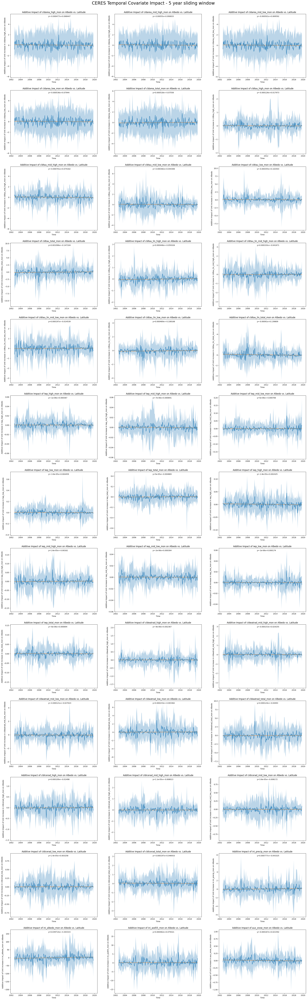

In [224]:
subset_range = False
fig, axarr = plt.subplots(13, 3,figsize=(30,100))
idx=0
fig.suptitle('CERES Temporal Covariate Impact - 5 year sliding window',y=0.89,fontsize=24)
for i in range(0,len(axarr)):
    for j in range(0,len(axarr[i])):
        label=unique_labels[idx]
        subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label]
        subset = subset.reset_index()
        z = np.polyfit(subset.index, subset["coef"], 1)
        p = np.poly1d(z)
        sns.lineplot(x=subset["time"] ,y=p(subset.index),ax=axarr[i][j],color="C1")
        # the line equation:
        max_val = subset["coef_upper"].max()
        y_text = max_val
        axarr[i][j].text(pd.to_datetime("01-01-2010"),y_text , 
                         f"y={round(z[0],6)}x+{round(z[1],6)}")

        sns.lineplot(x="time",y="coef",data = subset,ax=axarr[i][j], color='C0')
#         sns.lineplot(x="time",y="coef_upper",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
#         sns.lineplot(x="time",y="coef_lower",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
        axarr[i][j].fill_between(subset["time"], subset["coef_lower"], subset["coef_upper"], alpha=.3)

        axarr[i][j].set_ylabel(f"Additive Impact of Unit increase in {label} on Albedo")
        axarr[i][j].set_xlabel(f"Time")
        axarr[i][j].set_title(f"Additive Impact of {label} on Albedo vs. Latitude")  
        if subset_range:
            axarr[i][j].set_ylim(-.005,.005)
        idx+=1
plt.savefig('plots/temporal_evolution_with_conf.png')


/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode', 'time'], dtype='object')
  subset = subset.rolling(window=rolling_window).mean().dropna()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["time"] = subset.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future versi

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode', 'time'], dtype='object')
  subset = subset.rolling(window=rolling_window).mean().dropna()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["time"] = subset.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future versi

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode', 'time'], dtype='object')
  subset = subset.rolling(window=rolling_window).mean().dropna()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["time"] = subset.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future versi

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode', 'time'], dtype='object')
  subset = subset.rolling(window=rolling_window).mean().dropna()
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["time"] = subset.index
/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/1964747891.py:14: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future versi

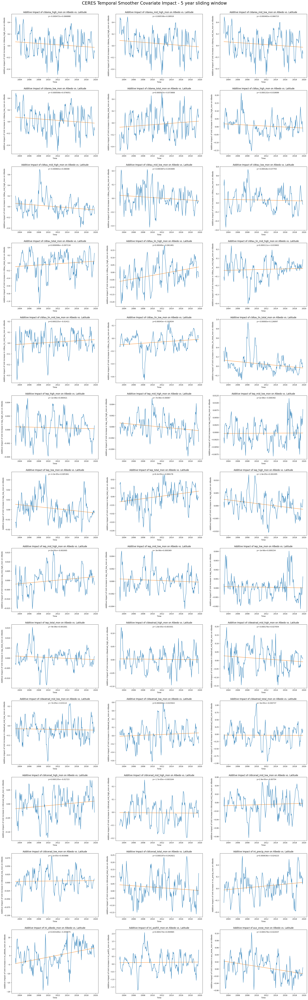

In [225]:
subset_range = False
fig, axarr = plt.subplots(13, 3,figsize=(30,100))
idx=0
rolling_window = 6
fig.suptitle('CERES Temporal Smoother Covariate Impact - 5 year sliding window',y=0.89,fontsize=24)

for i in range(0,len(axarr)):
    for j in range(0,len(axarr[i])):
        label=unique_labels[idx]
        subset = regressor_dfs_concat[regressor_dfs_concat["regressor"] == label]
        subset = subset.reset_index()
        subset.index = subset.time

        subset = subset.rolling(window=rolling_window).mean().dropna()
        int_index = range(len(subset))
        z = np.polyfit(int_index, subset["coef"], 1)
        p = np.poly1d(z)
        subset["time"] = subset.index
        sns.lineplot(x=subset["time"] ,y=p(int_index),ax=axarr[i][j],color="C1")
        # the line equation:
        max_val = subset["coef"].max()
        y_text = max_val
        axarr[i][j].text(pd.to_datetime("01-01-2010"),y_text , 
                         f"y={round(z[0],6)}x+{round(z[1],6)}")

        sns.lineplot(x="time",y="coef",data = subset,ax=axarr[i][j], color='C0')
#         sns.lineplot(x="time",y="coef_upper",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
#         sns.lineplot(x="time",y="coef_lower",data = subset,ax=axarr[i][j], color='C0',alpha=0.3)
#         axarr[i][j].fill_between(subset["time"], subset["coef_lower"], subset["coef_upper"], alpha=.3)

        axarr[i][j].set_ylabel(f"Additive Impact of Unit increase in {label} on Albedo")
        axarr[i][j].set_xlabel(f"Time")
        axarr[i][j].set_title(f"Additive Impact of {label} on Albedo vs. Latitude")  
        if subset_range:
            axarr[i][j].set_ylim(-.005,.005)
        idx+=1
plt.savefig('plots/temporal_evolution_no_conf.png')


#  MERRA-2 Additive Impact

In [168]:
subset.rolling(window=12).mean()

/var/folders/8_/qfq2f03j40x2lyrbnm67xqm40000gn/T/ipykernel_28472/649059214.py:1: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['regressor', 'regressor_mode', 'time'], dtype='object')
  subset.rolling(window=12).mean()


,index,center,coef_lower,coef,coef_upper
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
201,38.0,5.483392,-0.170017,-0.008986,0.155159
202,38.0,5.486099,-0.170249,-0.009954,0.151404
203,38.0,5.488966,-0.165842,-0.012022,0.139779
204,38.0,5.491727,-0.162860,-0.012175,0.139470


In [104]:
import os
import netCDF4
import xarray as xr

def load_netcdf(f_path:str)-> pd.DataFrame:
    ds = xr.open_dataset(f_path,engine="netcdf4")
    df = ds.to_dataframe()
    return df

        

In [108]:
path = "../data/MERRA2-NEW/"
dfs = []
top_level_folders = filter(lambda f: "MONTHLY" in f, os.listdir(path))
for top_level_folders in top_level_folders:
    sub_folder_path = os.path.join(path,top_level_folders)
    sub_folders = filter(lambda f: ".DS" not in f, os.listdir(sub_folder_path))
    for sub_folder in sub_folders:
        sub_sub_folder_path = os.path.join(sub_folder_path,sub_folder)
        files = os.listdir(sub_sub_folder_path)
        for file in files:
            print(file)
            try:
                file_path = os.path.join(sub_sub_folder_path,file)
                df = load_netcdf(file_path)
                dfs.append(df)
            except OSError:
                pass


MERRA2_400.instM_2d_int_Nx.201401.SUB.nc
MERRA2_400.instM_2d_int_Nx.201501.SUB.nc
MERRA2_400.instM_2d_int_Nx.202202.SUB.nc
MERRA2_300.instM_2d_int_Nx.200707.SUB.nc
MERRA2_300.instM_2d_int_Nx.200607.SUB.nc
MERRA2_300.instM_2d_int_Nx.200912.SUB.nc
MERRA2_300.instM_2d_int_Nx.200812.SUB.nc
MERRA2_400.instM_2d_int_Nx.202210.SUB.nc
MERRA2_400.instM_2d_int_Nx.201209.SUB.nc
MERRA2_400.instM_2d_int_Nx.201309.SUB.nc
MERRA2_100.instM_2d_int_Nx.198211.SUB.nc
MERRA2_400.instM_2d_int_Nx.201305.SUB.nc
MERRA2_400.instM_2d_int_Nx.201205.SUB.nc
MERRA2_300.instM_2d_int_Nx.201009.SUB.nc
MERRA2_300.instM_2d_int_Nx.200312.SUB.nc
MERRA2_300.instM_2d_int_Nx.200212.SUB.nc
MERRA2_400.instM_2d_int_Nx.201106.SUB.nc
MERRA2_300.instM_2d_int_Nx.201005.SUB.nc
MERRA2_401.instM_2d_int_Nx.202107.SUB.nc
MERRA2_400.instM_2d_int_Nx.201710.SUB.nc
MERRA2_400.instM_2d_int_Nx.201610.SUB.nc
MERRA2_400.instM_2d_int_Nx.201905.SUB.nc
MERRA2_400.instM_2d_int_Nx.201805.SUB.nc
MERRA2_300.instM_2d_int_Nx.200504.SUB.nc
MERRA2_300.instM

MERRA2_300.instM_2d_int_Nx.201010.SUB.nc
MERRA2_400.instM_2d_int_Nx.201101.SUB.nc
MERRA2_300.instM_2d_int_Nx.200307.SUB.nc
MERRA2_300.instM_2d_int_Nx.200207.SUB.nc
MERRA2_300.instM_2d_int_Nx.201002.SUB.nc
MERRA2_400.instM_2d_int_Nx.201802.SUB.nc
MERRA2_400.instM_2d_int_Nx.201902.SUB.nc
MERRA2_300.instM_2d_int_Nx.200403.SUB.nc
MERRA2_300.instM_2d_int_Nx.200503.SUB.nc
MERRA2_400.instM_2d_int_Nx.201609.SUB.nc
MERRA2_400.instM_2d_int_Nx.201709.SUB.nc
MERRA2_400.instM_2d_int_Nx.201910.SUB.nc
MERRA2_400.instM_2d_int_Nx.201810.SUB.nc
MERRA2_400.instM_2d_int_Nx.201705.SUB.nc
MERRA2_400.instM_2d_int_Nx.201605.SUB.nc
MERRA2_300.instM_2d_int_Nx.200511.SUB.nc
MERRA2_300.instM_2d_int_Nx.200411.SUB.nc
MERRA2_400.instM_2d_int_Nx.202006.SUB.nc
MERRA2_400.instM_2d_int_Nx.201111.SUB.nc
MERRA2_300.instM_2d_int_Nx.200305.SUB.nc
MERRA2_300.instM_2d_int_Nx.200205.SUB.nc
MERRA2_300.instM_2d_int_Nx.201012.SUB.nc
MERRA2_400.instM_2d_int_Nx.201103.SUB.nc
MERRA2_300.instM_2d_int_Nx.200209.SUB.nc
MERRA2_100.instM

MERRA2_300.tavgM_2d_csp_Nx.200607.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200707.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.202210.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201110.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.201001.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201102.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.202105.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.202005.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200512.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200412.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201706.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201606.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201801.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201901.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201409.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.201509.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200603.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200703.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200808.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200908.SUB.nc
MERRA2_400.tavgM_2d_csp_Nx.202206.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200904.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200804.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200711.SUB.nc
MERRA2_300.tavgM

MERRA2_400.tavgM_2d_rad_Nx.202110.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201806.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201906.SUB.nc
MERRA2_401.tavgM_2d_rad_Nx.202108.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.202102.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.202002.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201701.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201601.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201105.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200211.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200311.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.201006.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201109.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200303.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200203.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200509.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200409.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201703.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201603.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201908.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201808.SUB.nc
MERRA2_401.tavgM_2d_rad_Nx.202106.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201804.SUB.nc
MERRA2_400.tavgM_2d_rad_Nx.201904.SUB.nc
MERRA2_400.tavgM

MERRA200.prod.assim.tavgM_2d_lnd_Nx.199911.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200608.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200803.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198102.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198002.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201401.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198708.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199606.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200110.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.197902.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201207.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200102.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200606.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201503.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201511.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200409.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198211.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198311.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200405.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.199006.SUB.nc


MERRA2_300.tavgM_2d_csp_Nx.200211.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199310.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199210.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200407.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199202.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199302.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199802.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199902.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199609.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200112.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199709.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.199109.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199910.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199810.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199705.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199605.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.199105.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200102.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199707.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199607.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199912.SUB.nc
MERRA2_200.tavgM_2d_csp_Nx.199812.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.199107.SUB.nc
MERRA2_300.tavgM_2d_csp_Nx.200110.SUB.nc
MERRA2_200.tavgM

MERRA2_200.tavgM_2d_rad_Nx.199704.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199604.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199104.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199004.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199608.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199708.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199008.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199108.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199803.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199903.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198407.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198507.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199801.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199901.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198211.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200111.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198311.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199706.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199606.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199106.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199006.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198303.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200103.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198203.SUB.nc
MERRA2_200.tavgM

MERRA2_200.tavgM_2d_rad_Nx.199611.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199904.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199804.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199111.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199011.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198412.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198512.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199906.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199806.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198308.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200108.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198208.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199601.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199701.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199001.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.199101.SUB.nc
MERRA2_300.tavgM_2d_rad_Nx.200104.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198204.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198304.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199402.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.200003.SUB.nc
MERRA2_200.tavgM_2d_rad_Nx.199502.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198007.SUB.nc
MERRA2_100.tavgM_2d_rad_Nx.198107.SUB.nc
MERRA2_200.tavgM

MERRA2_300.instM_2d_gas_Nx.201008.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201107.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200407.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200507.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199302.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201601.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201105.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200211.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200311.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198011.SUB.nc
MERRA2_300.instM_2d_gas_Nx.201006.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198003.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200303.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200203.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201109.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201206.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201306.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200903.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200803.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201502.SUB.nc
MERRA2_400.instM_2d_gas_Nx.201402.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200708.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200608.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200604.SUB.nc
MERRA2_300.instM

MERRA200.prod.assim.tavgM_2d_lnd_Nx.199802.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200101.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199902.SUB.nc
MERRA301.prod.assim.tavgM_2d_lnd_Nx.201008.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199910.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199810.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199705.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201208.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201308.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199506.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.200007.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200210.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198408.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198508.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.201107.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198504.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.198404.SUB.nc
MERRA300.prod.assim.tavgM_2d_lnd_Nx.200302.SUB.nc
MERRA100.prod.assim.tavgM_2d_lnd_Nx.199005.SUB.nc
MERRA200.prod.assim.tavgM_2d_lnd_Nx.199310.SUB.nc


MERRA2_200.instM_2d_int_Nx.199311.SUB.nc
MERRA2_200.instM_2d_int_Nx.199211.SUB.nc
MERRA2_100.instM_2d_int_Nx.198606.SUB.nc
MERRA2_100.instM_2d_int_Nx.198706.SUB.nc
MERRA2_200.instM_2d_int_Nx.199203.SUB.nc
MERRA2_200.instM_2d_int_Nx.199303.SUB.nc
MERRA2_100.instM_2d_int_Nx.198405.SUB.nc
MERRA2_100.instM_2d_int_Nx.198505.SUB.nc
MERRA2_100.instM_2d_int_Nx.198509.SUB.nc
MERRA2_100.instM_2d_int_Nx.198409.SUB.nc
MERRA2_200.instM_2d_int_Nx.199803.SUB.nc
MERRA2_200.instM_2d_int_Nx.199903.SUB.nc
MERRA2_100.instM_2d_int_Nx.199008.SUB.nc
MERRA2_100.instM_2d_int_Nx.199108.SUB.nc
MERRA2_200.instM_2d_int_Nx.199608.SUB.nc
MERRA2_200.instM_2d_int_Nx.199708.SUB.nc
MERRA2_100.instM_2d_int_Nx.199104.SUB.nc
MERRA2_100.instM_2d_int_Nx.199004.SUB.nc
MERRA2_200.instM_2d_int_Nx.199704.SUB.nc
MERRA2_200.instM_2d_int_Nx.199604.SUB.nc
MERRA2_200.instM_2d_int_Nx.199911.SUB.nc
MERRA2_200.instM_2d_int_Nx.199811.SUB.nc
MERRA2_100.instM_2d_int_Nx.198301.SUB.nc
MERRA2_100.instM_2d_int_Nx.198201.SUB.nc
MERRA2_100.instM

MERRA2_100.tavgM_2d_csp_Nx.198709.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198609.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198902.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198802.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198306.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198206.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.199003.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198402.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198502.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198510.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198410.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198906.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198806.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198601.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198701.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198105.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198109.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198603.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198703.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198808.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198908.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198904.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198804.SUB.nc
MERRA2_100.tavgM_2d_csp_Nx.198711.SUB.nc
MERRA2_100.tavgM

MERRA2_200.instM_2d_gas_Nx.200011.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199410.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198804.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198611.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198711.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198703.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199306.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199206.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198808.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198412.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198512.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199806.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198308.SUB.nc
MERRA2_300.instM_2d_gas_Nx.200108.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198208.SUB.nc
MERRA2_100.instM_2d_gas_Nx.199101.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199601.SUB.nc
MERRA2_200.instM_2d_gas_Nx.199701.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198204.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198304.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198410.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198510.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198502.SUB.nc
MERRA2_100.instM_2d_gas_Nx.198402.SUB.nc
MERRA2_200.instM

# Kernel Time Varying Regression w/ Orbit-ML


In [70]:
from orbit.models import KTR
from orbit.diagnostics.plot import plot_predicted_components
from orbit.utils.plot import get_orbit_style


### CERES

In [71]:
data_agg_ceres["date"] = data_agg_ceres.index

/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/orbit/forecaster/forecaster.py:292: UserWarning: Datetime index is not evenly distributed
  warnings.warn("Datetime index is not evenly distributed")
INFO:orbit:Optimizing (PyStan) with algorithm: LBFGS.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/orbit/forecaster/forecaster.py:292: UserWarning: Datetime index is not evenly distributed
  warnings.warn("Datetime index is not evenly distributed")
INFO:orbit:Using SVI (Pyro) with steps: 301, samples: 100, learning rate: 0.1, learning_rate_total_decay: 1.0 and particles: 100.
INFO:root:Guessed max_plate_nesting = 1
INFO:orbit:step    0 loss = 3.1856e+05, scale = 0.099679
INFO:orbit:step  100 loss = 49579, scale = 0.062542
INFO:orbit:step  200 loss = 50937, scale = 0.080116
INFO:orbit:step  300 loss = 60562, scale = 0.086932


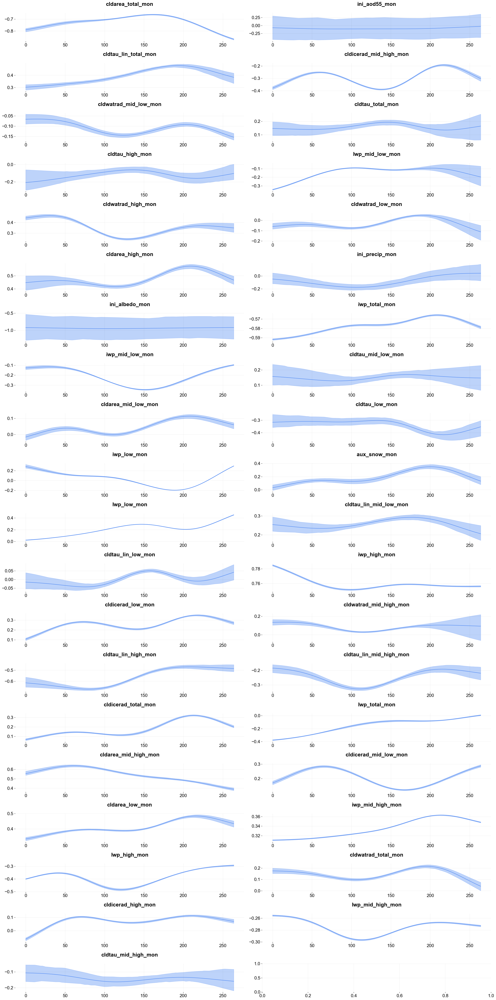

In [72]:
response_col = "albedo"
date_col = "date"

regressor_col = list(set(data_agg_ceres.columns.tolist()) - set(['albedo','toa_alb_all_mon','weights',"date"]))
ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    regressor_col=regressor_col,
    prediction_percentiles=[2.5, 97.5],
#     seasonality=[12], # cant use 365 seasonality because have only 59 rows
    estimator='pyro-svi',
    n_bootstrap_draws=4000,
    message=100)
ktr.fit(df=data_agg_ceres)
ktr.plot_regression_coefs(figsize=(25, 50), include_ci=True);


In [73]:
test_size=12
train_df=data_agg_ceres[:-test_size]
test_df=data_agg_ceres[-test_size:]

In [75]:
response_col = "albedo"
date_col = "date"

regressor_col = list(set(data_agg_ceres.columns.tolist()) - set(['albedo','toa_alb_all_mon','weights',"date"]))
ktr = KTR(
    response_col=response_col,
    date_col=date_col,
#     regressor_col=regressor_col,
    prediction_percentiles=[2.5, 97.5],
#     seasonality=12, # cant use 365 seasonality because have only 59 rows
    estimator='pyro-svi',
    n_bootstrap_draws=4000,
    message=100)
ktr.fit(df=train_df)


/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/orbit/forecaster/forecaster.py:292: UserWarning: Datetime index is not evenly distributed
  warnings.warn("Datetime index is not evenly distributed")
INFO:orbit:Optimizing (PyStan) with algorithm: LBFGS.
/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/orbit/forecaster/forecaster.py:292: UserWarning: Datetime index is not evenly distributed
  warnings.warn("Datetime index is not evenly distributed")
INFO:orbit:Using SVI (Pyro) with steps: 301, samples: 100, learning rate: 0.1, learning_rate_total_decay: 1.0 and particles: 100.
INFO:root:Guessed max_plate_nesting = 1
INFO:orbit:step    0 loss = 4558.9, scale = 0.08471
INFO:orbit:step  100 loss = 1622.8, scale = 0.26855
INFO:orbit:step  200 loss = -771.15, scale = 0.2805
INFO:orbit:step  300 loss = 1753.9, scale = 0.27576


/Users/samuelkahn/Desktop/ClimateAIResearch/climate-ai/lib/python3.9/site-packages/orbit/forecaster/forecaster.py:337: UserWarning: Datetime index is not evenly distributed
  warnings.warn("Datetime index is not evenly distributed")


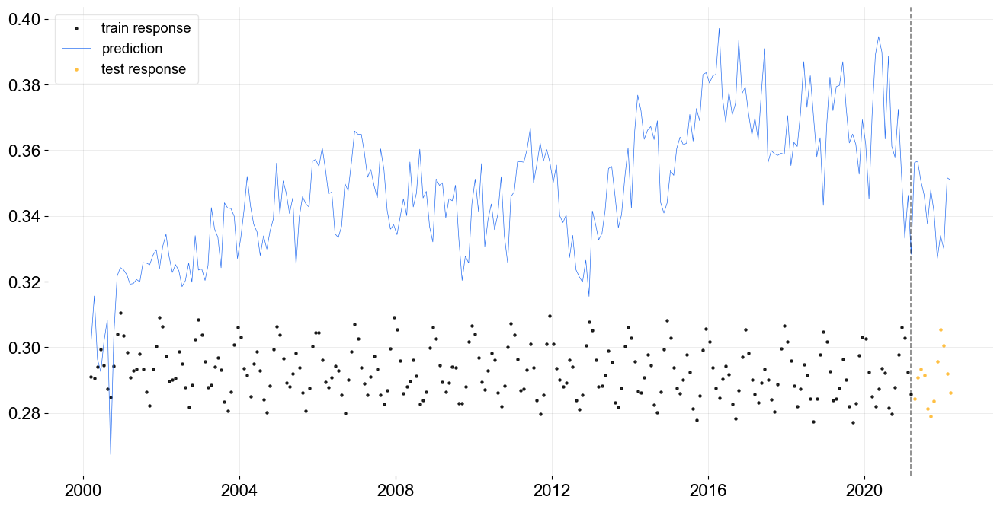

In [76]:
from orbit.diagnostics.plot import plot_predicted_data, plot_predicted_components
predicted_df = ktr.predict(df=data_agg_ceres)

_ = plot_predicted_data(training_actual_df=train_df, predicted_df=predicted_df,
                        date_col=date_col, actual_col=response_col,
                        test_actual_df=test_df, markersize=20, lw=.5)

In [305]:
train_df

,toa_alb_all_mon,cldarea_high_mon,cldarea_mid_high_mon,cldarea_mid_low_mon,cldarea_low_mon,cldarea_total_mon,cldtau_high_mon,cldtau_mid_high_mon,cldtau_mid_low_mon,cldtau_low_mon,...,cldicerad_mid_low_mon,cldicerad_low_mon,cldicerad_total_mon,ini_precip_mon,ini_albedo_mon,ini_aod55_mon,aux_snow_mon,weights,albedo,date
time,,,,,,,,,,,,,,,,,,,,,
2000-03-15,14863.701172,325365.03125,710492.6250,612619.68750,1565597.250,3214074.50,227183.890625,209642.453125,216405.234375,192975.421875,...,1.365360e+06,1.277105e+06,1365930.250,110822.609375,5712.799805,7998.690430,436345.468750,328.6332,0.265668,2000-03-15
2000-04-15,14808.598633,351689.50000,727514.5625,616444.31250,1543303.250,3238951.75,216621.937500,209505.062500,201003.093750,181932.296875,...,1.370766e+06,1.275305e+06,1367639.500,114384.390625,5340.724121,8002.932129,303046.937500,328.6332,0.265319,2000-04-15
2000-05-15,14948.473633,328866.84375,717872.0625,615759.93750,1596044.000,3258542.75,192774.546875,205743.484375,197291.031250,176799.828125,...,1.357628e+06,1.260206e+06,1355354.000,115846.679688,4960.452637,8354.254883,176048.468750,328.6332,0.268467,2000-05-15
2000-06-15,15144.111328,340727.21875,707079.9375,602464.50000,1592533.125,3242804.75,203464.562500,204999.296875,197439.390625,173490.734375,...,1.343189e+06,1.255297e+06,1351740.500,118829.539062,4862.062988,8142.112305,130851.625000,328.6332,0.273205,2000-06-15
2000-07-15,14921.473633,341759.03125,687865.1250,596880.93750,1603395.750,3229900.75,193472.890625,200447.796875,194954.812500,175467.671875,...,1.338171e+06,1.271945e+06,1342248.875,122810.273438,5031.596680,8200.542969,148147.203125,328.6332,0.268777,2000-07-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-15,15210.831055,432512.81250,779147.8125,513920.71875,1591461.875,3317043.25,131313.234375,158514.453125,199315.375000,176303.828125,...,1.061836e+06,1.043995e+06,1272205.375,108817.007812,5446.070801,6383.071289,292741.531250,328.6332,0.271876,2020-11-15
2020-12-15,15594.893555,441519.25000,802637.0000,528451.75000,1567242.875,3339850.75,128256.312500,154640.375000,199781.234375,180301.390625,...,1.047538e+06,1.054285e+06,1260779.000,107774.468750,5543.820801,6226.565918,387249.375000,328.6332,0.279386,2020-12-15
2021-01-15,15382.106445,456136.65625,810890.0000,520372.00000,1521900.000,3309298.75,134770.015625,158161.234375,204265.031250,178733.281250,...,1.059382e+06,1.057662e+06,1257764.375,107207.617188,5638.378418,6638.694824,423612.000000,328.6332,0.276362,2021-01-15
